# 01) INSTALAÇÃO DA BIBLIOTECA

In [ ]:
pip install opencv-python matplotlib

# 02) CARREGAR IMAGENS

In [23]:
import cv2
import glob
import os
import numpy as np
from pathlib import Path

# Caminhos relativos (corretos para quem está na pasta notebooks/)
path_raw = Path("../data/raw/")
images = [cv2.imread(str(file)) for file in path_raw.glob("*.jpg")]

# Verifique se as imagens foram carregadas corretamente
print(f"Total de imagens carregadas: {len(images)}")

Total de imagens carregadas: 143


##### Carregamento de imagens

As imagens foram carregadas diretamente da pasta `data/raw/`. Essas imagens representam cenas urbanas com possíveis grafites. Serão usadas como base para todas as etapas de pré-processamento e detecção.


## 03) Conversão para escala de cinza

In [24]:
gray_images = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]

##### Conversão para escala de cinza

Converter as imagens para tons de cinza reduz a complexidade dos dados, mantendo apenas a informação de intensidade luminosa. Essa etapa é essencial antes de aplicar filtros e detectar bordas, pois evita processamentos desnecessários nas cores.


## Aplicação dos filtros espaciais

### 04) Filtro Gaussiano para suavizar a imagem e reduzir ruído:

In [25]:
gaussian_images = [cv2.GaussianBlur(img, (5,5), 0) for img in gray_images]

##### Filtro Gaussiano

O filtro Gaussiano aplica um desfoque suave na imagem para reduzir ruídos e detalhes muito pequenos. Isso ajuda a evitar que o detector de bordas capture regiões irrelevantes. Ele é indicado quando há ruído do tipo "granulação" na imagem.


### 05) Filtro Mediano

In [26]:
median_images = [cv2.medianBlur(img, 5) for img in gray_images]

##### Filtro Mediano

O filtro Mediano também reduz ruídos, mas de maneira diferente do Gaussiano. Ele preserva melhor as bordas e remove pontuais isolados (ruído "sal e pimenta"). Ideal para cenas urbanas com muitos contrastes e detalhes finos.


## Detecção de bordas

### 06) Canny

In [27]:
canny_edges = [cv2.Canny(img, threshold1=100, threshold2=200) for img in gaussian_images]

##### Detecção de bordas com Canny

O algoritmo de Canny identifica bordas com base em transições abruptas de intensidade. Utiliza dois limiares (baixo e alto) para decidir quais bordas manter. É amplamente usado por sua eficiência e precisão.


### 07) Sobel

In [28]:
sobel_edges = [cv2.Sobel(img, cv2.CV_64F, 1, 1, ksize=3) for img in gaussian_images]

##### Detecção de bordas com Sobel

O filtro de Sobel calcula o gradiente da imagem nas direções horizontal e vertical. Ele detecta bordas com orientação e é útil para estruturas como traços de grafites, que muitas vezes possuem linhas retas.


## 08) Salvar resultados processados

In [29]:
from pathlib import Path

processed_path = Path("../data/processed/")
results_path = Path("../results/")

processed_path.mkdir(parents=True, exist_ok=True)
results_path.mkdir(parents=True, exist_ok=True)

for idx in range(len(images)):
    cv2.imwrite(str(processed_path / f"gray_{idx}.jpg"), gray_images[idx])
    cv2.imwrite(str(processed_path / f"gaussian_{idx}.jpg"), gaussian_images[idx])
    cv2.imwrite(str(processed_path / f"median_{idx}.jpg"), median_images[idx])
    cv2.imwrite(str(processed_path / f"canny_{idx}.jpg"), canny_edges[idx])
    cv2.imwrite(str(processed_path / f"sobel_{idx}.jpg"), np.uint8(np.absolute(sobel_edges[idx])))

## 09) Visualizar comparações

In [ ]:
import matplotlib.pyplot as plt

for i in range(len(images)):
    plt.figure(figsize=(12, 4))

    plt.subplot(131)
    plt.title('Original')
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))

    plt.subplot(132)
    plt.title('Gauss + Canny')
    plt.imshow(canny_edges[i], cmap='gray')

    plt.subplot(133)
    plt.title('Sobel')
    plt.imshow(np.uint8(np.absolute(sobel_edges[i])), cmap='gray')

    plt.tight_layout()
    plt.show()

##### Comparação visual dos filtros e bordas

Nesta etapa foram comparados os efeitos dos diferentes filtros (Gaussiano, Mediano) e detectores de borda (Canny, Sobel). Essa análise ajuda a entender qual combinação oferece melhor definição das áreas com grafite.


## 10) Detecção de contornos para realçar grafites

In [31]:
contoured_images = []

for i in range(len(canny_edges)):
    contoured = images[i].copy()
    contours, _ = cv2.findContours(canny_edges[i], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(contoured, contours, -1, (0, 255, 0), 2)
    contoured_images.append(contoured)

    # Salva a imagem com contornos
    cv2.imwrite(str(results_path / f"contornos_{i}.jpg"), contoured)

##### Realce das áreas com grafite (contornos)

As regiões detectadas pelo Canny foram contornadas nas imagens originais com a função `cv2.drawContours`. Isso permite visualizar claramente as áreas que o algoritmo considera como possíveis grafites, destacando-as em verde.


## 11) Extração de características de cor e textura

In [32]:
caracteristicas = []

for i in range(len(images)):
    img_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    mean_color = cv2.mean(img_rgb)[:3]  # média das 3 cores
    std_dev_texture = np.std(gray_images[i])  # desvio padrão como textura

    caracteristicas.append({
        "Imagem": f"imagem_{i}.jpg",
        "Média_R": mean_color[0],
        "Média_G": mean_color[1],
        "Média_B": mean_color[2],
        "Textura": std_dev_texture
    })

import pandas as pd
df_caracteristicas = pd.DataFrame(caracteristicas)
df_caracteristicas

,Imagem,Média_R,Média_G,Média_B,Textura
0,imagem_0.jpg,146.905140,145.264512,145.146348,58.973360
1,imagem_1.jpg,165.471300,169.201600,169.794276,63.212009
2,imagem_2.jpg,151.604144,152.665520,150.746008,69.662990
3,imagem_3.jpg,166.891452,172.774952,167.762056,56.433470
4,imagem_4.jpg,133.596120,132.323300,133.946904,56.657520
...,...,...,...,...,...
138,imagem_138.jpg,93.647988,105.310556,104.561092,49.033665
139,imagem_139.jpg,101.907432,111.232084,102.073324,52.170271
140,imagem_140.jpg,159.059304,159.711920,158.760576,49.289417
141,imagem_141.jpg,112.772344,115.914756,106.153520,76.322602


##### Extração de características (cor e textura)

Para futuras classificações automáticas, foram extraídas características básicas:
- **Cor média** (valores de R, G, B da imagem)
- **Textura** (desvio padrão da escala de cinza, que indica variações na imagem)

Esses dados foram armazenados em um arquivo `.csv` e podem ser usados para treinar modelos de IA no futuro.


## 12) Exportar características para CSV

In [33]:
df_caracteristicas.to_csv(str(results_path / "caracteristicas.csv"), index=False)

# 13) MORFOLOGIA MATEMÁTICA

##### Aplicação de Morfologia Matemática

Nesta etapa, serão aplicadas operações morfológicas às imagens com bordas (detectadas com o filtro de Canny) para melhorar a definição dos contornos dos grafites. As operações usadas foram **fechamento (closing)** e **abertura (opening)**, com o objetivo de unir bordas quebradas e eliminar pequenos ruídos.


In [1]:
from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt

input_path = Path("../data/processed/")
output_path = Path("../data/morphology/")
output_path.mkdir(parents=True, exist_ok=True)

canny_paths = list(input_path.glob("canny_*.jpg"))
canny_images = [cv2.imread(str(p), cv2.IMREAD_GRAYSCALE) for p in canny_paths]

##### Aplicação das operações de fechamento e abertura

O **fechamento** (dilatação seguida de erosão) foi utilizado para unir fragmentos desconectados nas bordas, preenchendo lacunas pequenas.  
A seguir, a **abertura** (erosão seguida de dilatação) foi aplicada para remover pequenos pontos de ruído ainda presentes após o fechamento.


In [4]:
kernel = np.ones((3, 3), np.uint8)
morph_images = []

for idx, img in enumerate(canny_images):
    closed = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)
    morph_images.append(opened)
    cv2.imwrite(str(output_path / f"morph_{idx}.jpg"), opened)

##### Comparação entre borda original e resultado da morfologia

A seguir, as imagens processadas com o detector de Canny são comparadas com os resultados após as operações morfológicas. Observa-se maior continuidade dos contornos e remoção de ruídos.


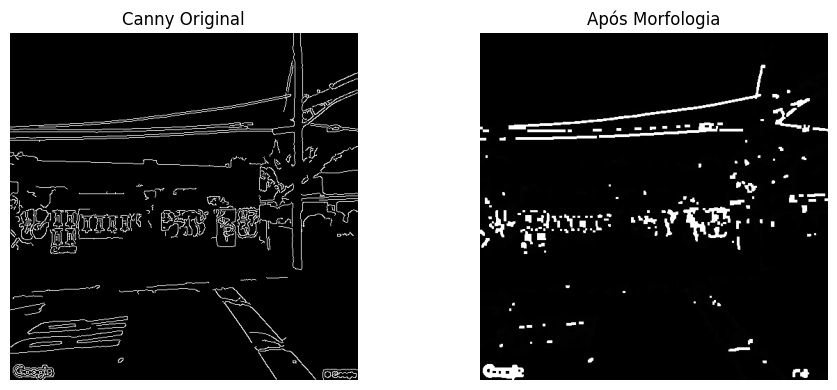

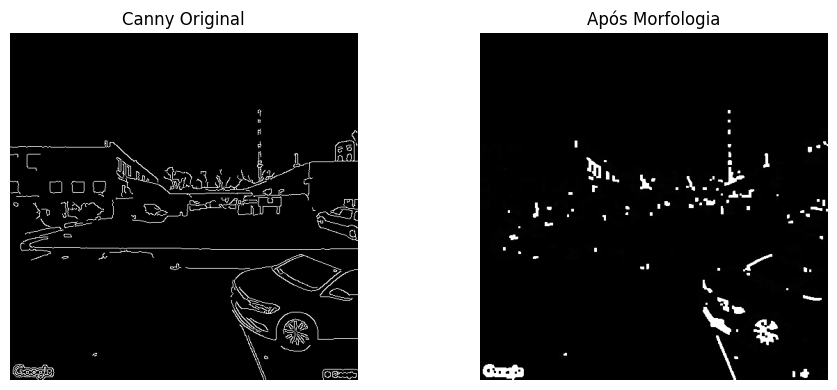

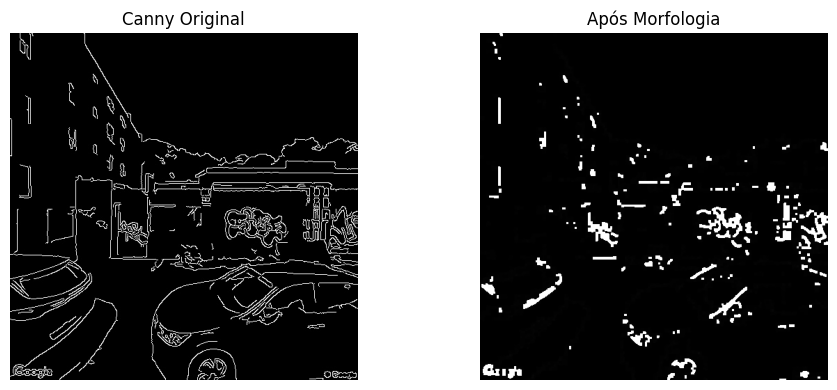

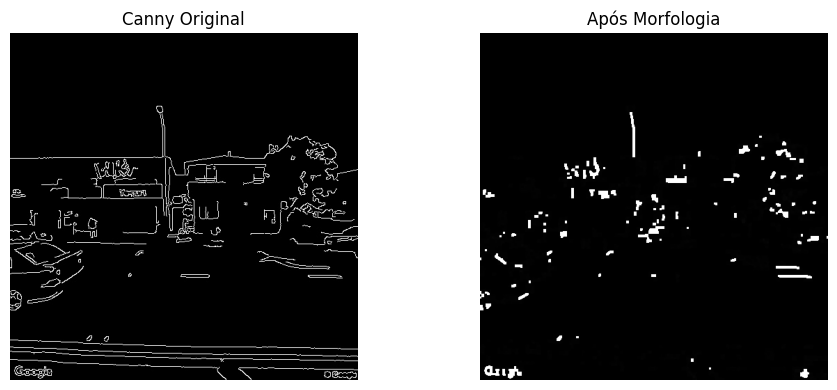

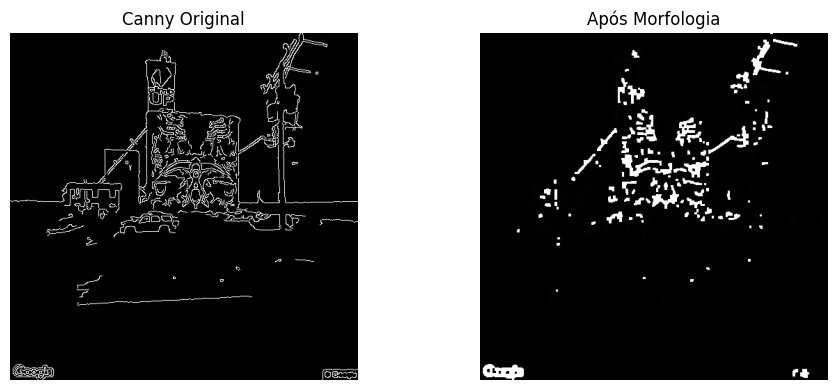

...

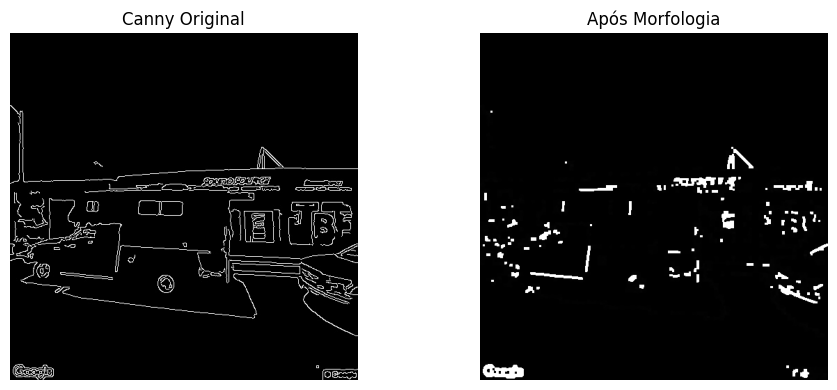

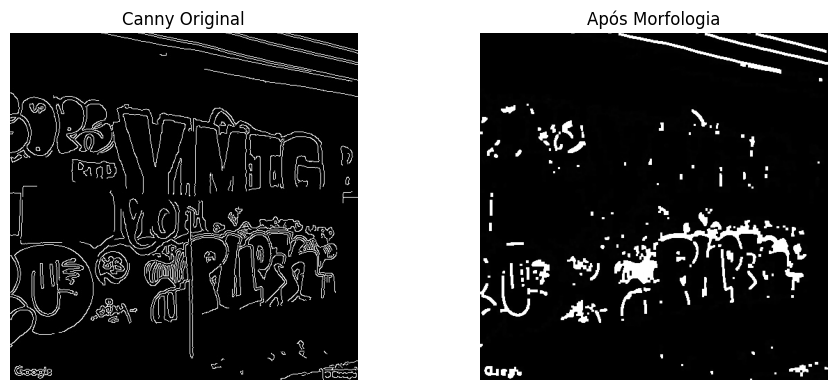

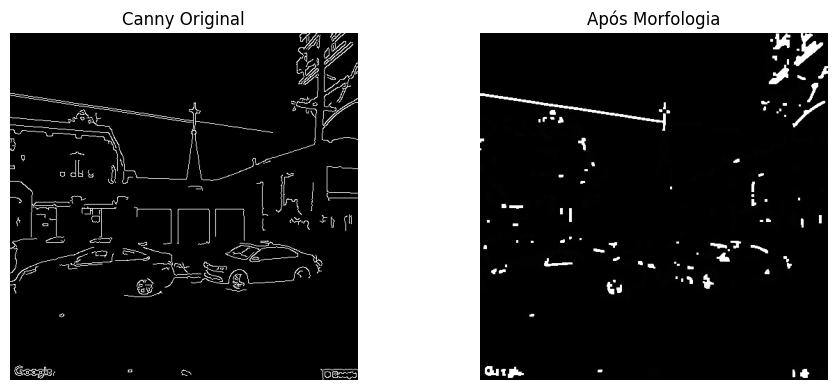

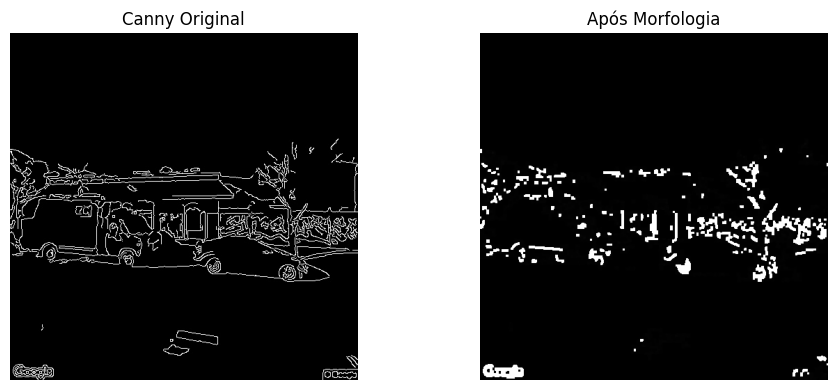

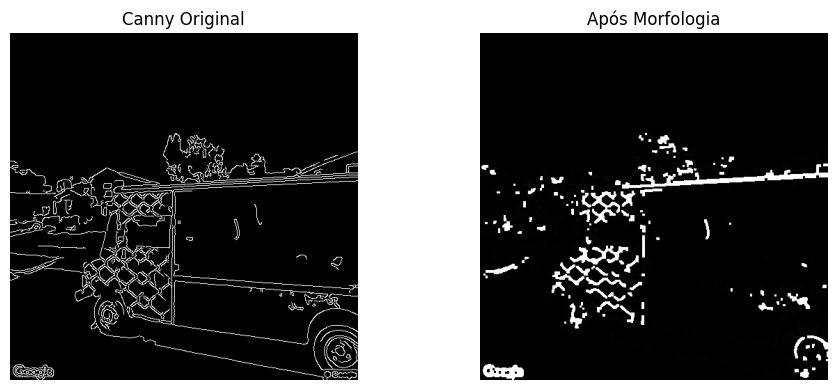

In [5]:
for i in range(len(canny_images)):
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.title("Canny Original")
    plt.imshow(canny_images[i], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Após Morfologia")
    plt.imshow(morph_images[i], cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

##### Conclusão sobre a morfologia aplicada

**Como você chegou à conclusão de qual melhor operação utilizar?**  
Foram testadas diferentes operações morfológicas, e a combinação **fechamento + abertura** demonstrou o melhor resultado: as bordas ficaram mais contínuas e houve redução de ruído.  

**A escolha da técnica de detecção da parte 1 influenciou o resultado da morfologia?**  
Sim. O uso do filtro de Canny após um pré-processamento com Gaussiano ou Mediano impacta diretamente na qualidade das bordas. Bordas mais limpas e bem definidas facilitam a aplicação eficaz da morfologia matemática.

##### Suporte de GenAI

As etapas de escolha das operações morfológicas, construção do código e validação visual foram realizadas com o suporte do ChatGPT (OpenAI), conforme orientado na proposta do mini projeto.
